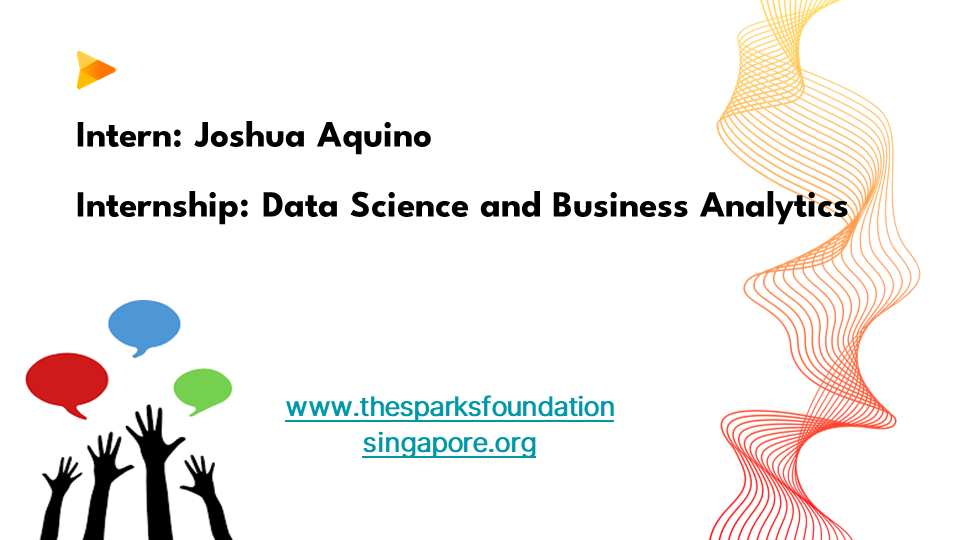

In [1]:
from IPython.display import Image
Image(filename='TSF1.png')

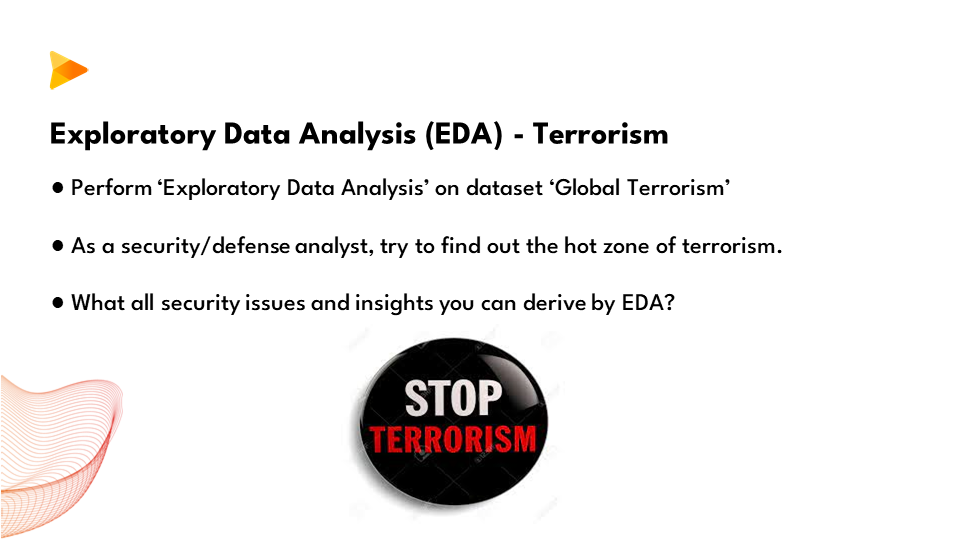

In [2]:
Image(filename='TSF2.png')

# **What is EDA?**

EDA stands for Exploratory Data Analysis. It is the process of analyzing and understanding data sets to summarize their main characteristics and gain insights into the underlying patterns, relationships, and trends. EDA typically involves methods such as data visualization, summary statistics, and hypothesis testing, and is often used as a precursor to more advanced analysis techniques. The goal of EDA is to gain a deeper understanding of the data and uncover any interesting or important information that may be hidden within it.



## **Import necessary Python libraries for data wrangling and visualization**

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
import warnings

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 50000)

## **Import csv file for Global Terrorism**

In [4]:
# Load the Global Terrorism dataset into a pandas DataFrame
t_df = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='Windows-1252')
t_df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,gsubname3,motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,14,Private Citizens & Property,68.0,Named Civilian,NaN,Julio Guzman,58.0,Dominican Republic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MANO-D,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,6,Hostage Taking (Kidnapping),NaN,NaN,NaN,NaN,7,Government (Diplomatic),45.0,"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",21.0,Belgium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23rd of September Communist League,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,Mexico,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,10,Journalists & Media,54.0,Radio Journalist/Staff/Facility,Voice of America,Employee,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,3,Bombing/Explosion,NaN,NaN,NaN,NaN,7,Government (Diplomatic),46.0,Embassy/Consulate,NaN,U.S. Embassy,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,Explosives,16.0,Unknown Explosive Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Explosive,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN

## **Data Preprocessing**

In [5]:
# Check the shape of the dataset
t_df.shape

(181691, 135)

In [6]:
# Check for missing values in the dataset
t_df.isnull().sum()

eventid                    0
iyear                      0
imonth                     0
iday                       0
approxdate            172452
extended                   0
resolution            179471
country                    0
country_txt                0
region                     0
region_txt                 0
provstate                421
city                     435
latitude                4556
longitude               4557
specificity                6
vicinity                   0
location              126196
summary                66129
crit1                      0
crit2                      0
crit3                      0
doubtterr                  1
alternative           152680
alternative_txt       152680
multiple                   1
success                    0
suicide                    0
attacktype1                0
attacktype1_txt            0
attacktype2           175377
attacktype2_txt       175377
attacktype3           181263
attacktype3_txt       181263
targtype1     

In [7]:
# Check the data types of the columns
t_df.dtypes

eventid                 int64
iyear                   int64
imonth                  int64
iday                    int64
approxdate             object
extended                int64
resolution             object
country                 int64
country_txt            object
region                  int64
region_txt             object
provstate              object
city                   object
latitude              float64
longitude             float64
specificity           float64
vicinity                int64
location               object
summary                object
crit1                   int64
crit2                   int64
crit3                   int64
doubtterr             float64
alternative           float64
alternative_txt        object
multiple              float64
success                 int64
suicide                 int64
attacktype1             int64
attacktype1_txt        object
attacktype2           float64
attacktype2_txt        object
attacktype3           float64
attacktype

In [8]:
# Filter the dataset to include only relevant columns
t_df = t_df[['iyear', 'country_txt', 'region_txt', 'city', 'latitude', 'longitude', 
         'attacktype1_txt', 'targtype1_txt', 'weaptype1_txt',  'nkill', 'nwound']]
t_df.head()

,iyear,country_txt,region_txt,city,latitude,longitude,attacktype1_txt,targtype1_txt,weaptype1_txt,nkill,nwound
0,1970,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,Private Citizens & Property,Unknown,1.0,0.0
1,1970,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),Government (Diplomatic),Unknown,0.0,0.0
2,1970,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,Journalists & Media,Unknown,1.0,0.0
3,1970,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,Government (Diplomatic),Explosives,NaN,NaN
4,1970,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,Government (Diplomatic),Incendiary,NaN,NaN


In [9]:
# list of columns to replace NaN with 0
cols_to_replace = ['nkill', 'nwound']

# loop over columns and replace NaN with 0
for col in cols_to_replace:
    t_df[col] = t_df[col].fillna(0)
t_df

,iyear,country_txt,region_txt,city,latitude,longitude,attacktype1_txt,targtype1_txt,weaptype1_txt,nkill,nwound
0,1970,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,Private Citizens & Property,Unknown,1.0,0.0
1,1970,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),Government (Diplomatic),Unknown,0.0,0.0
2,1970,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,Journalists & Media,Unknown,1.0,0.0
3,1970,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,Government (Diplomatic),Explosives,0.0,0.0
4,1970,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,Government (Diplomatic),Incendiary,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
181686,2017,Somalia,Sub-Saharan Africa,Ceelka Geelow,2.359673,45.385034,Armed Assault,Military,Firearms,1.0,2.0
181687,2017,Syria,Middle East & North Africa,Jableh,35.407278,35.942679,Bombing/Explosion,Military,Explosives,2.0,7.0
181688,2017,Philippines,Southeast Asia,Kubentog,6.900742,124.437908,Facility/Infrastructure Attack,Private Citizens & Property,Incendiary,0.0,0.0
181689,2017,India,South Asia,Imphal,24.798346,93.940430,Bombing/Explosion,Government (General),Explosives,0.0,0.0


In [10]:
t_df['casualties'] = t_df['nkill'] + t_df['nwound']

In [11]:
t_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 12 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   iyear            181691 non-null  int64  
 1   country_txt      181691 non-null  object 
 2   region_txt       181691 non-null  object 
 3   city             181256 non-null  object 
 4   latitude         177135 non-null  float64
 5   longitude        177134 non-null  float64
 6   attacktype1_txt  181691 non-null  object 
 7   targtype1_txt    181691 non-null  object 
 8   weaptype1_txt    181691 non-null  object 
 9   nkill            181691 non-null  float64
 10  nwound           181691 non-null  float64
 11  casualties       181691 non-null  float64
dtypes: float64(5), int64(1), object(6)
memory usage: 16.6+ MB


In [12]:
print(t_df['casualties'].describe())

count    181691.000000
mean          5.150156
std          40.555416
min           0.000000
25%           0.000000
50%           1.000000
75%           4.000000
max        9574.000000
Name: casualties, dtype: float64


In [13]:
# Check the number of terrorist attacks by country
region_attacks = t_df['region_txt'].value_counts()
region_attacks

region_txt
Middle East & North Africa     50474
South Asia                     44974
South America                  18978
Sub-Saharan Africa             17550
Western Europe                 16639
Southeast Asia                 12485
Central America & Caribbean    10344
Eastern Europe                  5144
North America                   3456
East Asia                        802
Central Asia                     563
Australasia & Oceania            282
Name: count, dtype: int64

## **EDA**


## **Regions with most terrorist attacks**

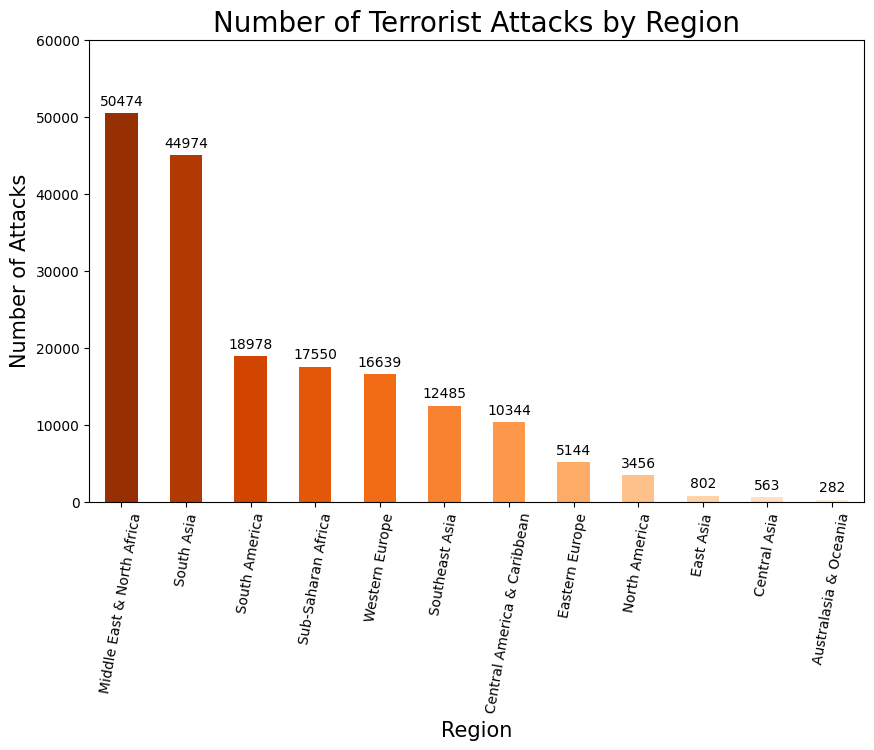

In [14]:
# Calculate the number of attacks by region
region_attacks = t_df.groupby('region_txt').size()

# Sort the region_attacks by number of attacks
sorted_region_attacks = region_attacks.sort_values(ascending=False)

# Create a sequential orange color map
cmap = sns.color_palette("Oranges_r", len(sorted_region_attacks))

# Plot the bar chart with the sequential orange color
ax = sorted_region_attacks.plot(kind='bar', figsize=(10, 6), color=cmap)

# Set the title and axis labels
plt.title('Number of Terrorist Attacks by Region', fontsize = 20)
plt.xlabel('Region',fontsize = 15)
plt.xticks(rotation=80)
plt.ylabel('Number of Attacks',fontsize = 15)
ax.set_ylim(0, 60000)

# Add annotations
for i, v in enumerate(sorted_region_attacks):
    ax.text(i, v + 1000, str(v), color='black', fontsize=10, ha='center')

# Show the plot
plt.show()

## **Heat map for number of terrorist attacks by Country and Year**

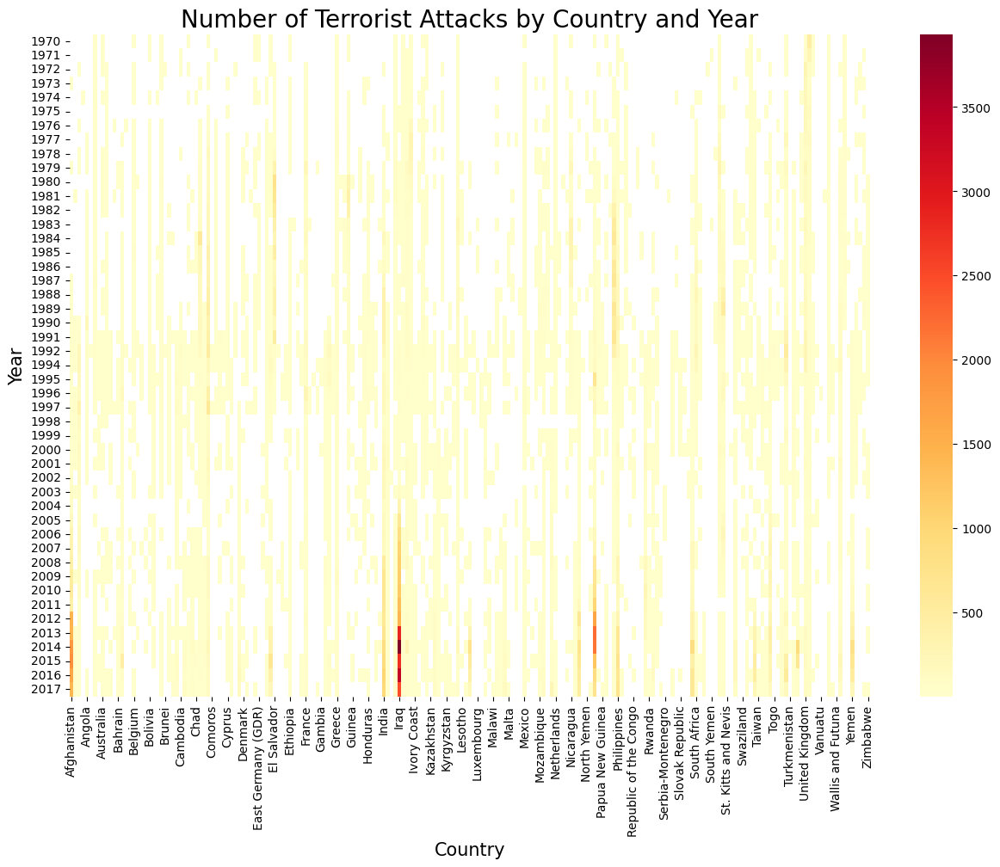

In [15]:
# Filter for necessary columns
t0_df = t_df[['iyear', 'country_txt']]

# Count the number of attacks by year and country
t1_df = t0_df.groupby(['iyear', 'country_txt']).size().reset_index(name='counts')

# Pivot the table to have years as rows and countries as columns
t2_df = t1_df.pivot(index='iyear', columns='country_txt', values='counts')

# Create a heatmap
plt.figure(figsize=(15,10))
sns.heatmap(t2_df, cmap='YlOrRd', cbar=True)
plt.title('Number of Terrorist Attacks by Country and Year',fontsize = 20)
plt.xlabel('Country',fontsize = 15)
plt.ylabel('Year',fontsize = 15)
plt.show()

## **Terrorism hotspots by country**

In [16]:
# Group the data by country and count the number of attacks
country_attacks = t_df.groupby('country_txt').size().reset_index(name='count')

# Create the choropleth map
fig = px.choropleth(country_attacks, 
                    locations='country_txt', 
                    color='count',
                    locationmode='country names',
                    color_continuous_scale=px.colors.sequential.Oranges,
                    title= 'Thematic Map Showing Terrorism Hotspots by Country')

fig.update_layout(title_x=0.5)
fig.update_layout(title_font_size=25)

# Add annotations
annotations = []
for geo in fig['data'][0]['locations']:
    annotations.append(dict(x=country_attacks[country_attacks['country_txt'] == geo]['count'].index[0],
                            y=country_attacks[country_attacks['country_txt'] == geo]['count'].values[0],
                            text=str(country_attacks[country_attacks['country_txt'] == geo]['count'].values[0]),
                            showarrow=False))
fig.update_layout(annotations=annotations)

# Display the map
fig.show()

heatmap_data = [go.Heatmap(x=t_df['iyear'], y=t_df['region_txt'], z=t_df['nkill'], colorscale='Viridis')]
heatmap_layout = go.Layout(title='Terrorist Attacks by Year and Country', xaxis=dict(title='Year'), yaxis=dict(title='Country'))
fig = go.Figure(data=heatmap_data, layout=heatmap_layout)
pyo.plot(fig, filename='heatmap.html')

In [17]:
# remove rows with 'Unknown' in the city column
tc_df = t_df[t_df['city'] != 'Unknown']

In [18]:
# Check the number of terrorist attacks by city
city_attacks = tc_df['city'].value_counts()
city_attacks

city
Baghdad                                                              7589
Karachi                                                              2652
Lima                                                                 2359
Mosul                                                                2265
Belfast                                                              2171
Santiago                                                             1621
Mogadishu                                                            1581
San Salvador                                                         1558
Istanbul                                                             1048
Athens                                                               1019
Bogota                                                                984
Kirkuk                                                                925
Beirut                                                                918
Medellin                         

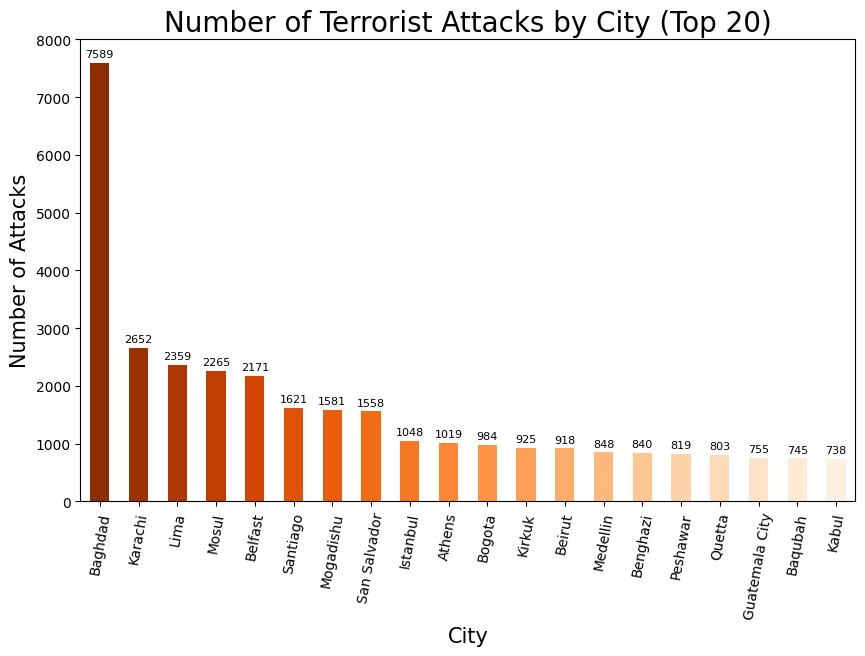

In [19]:
# Get the top 20 countries with the most attacks
top20_attacks = city_attacks.nlargest(20)

# Sort the region_attacks by number of attacks
sorted_region_attacks = top20_attacks.sort_values(ascending=False)

# Create a sequential orange color map
cmap = sns.color_palette("Oranges_r", len(sorted_region_attacks))

# Plot the bar chart with the sequential orange color
ax = sorted_region_attacks.plot(kind='bar', figsize=(10, 6), color=cmap)

# Set the title and axis labels
plt.title('Number of Terrorist Attacks by City (Top 20)', fontsize = 20)
plt.xlabel('City',fontsize = 15)
plt.xticks(rotation=80)
plt.ylabel('Number of Attacks',fontsize = 15)
ax.set_ylim(0, 8000)

# Add annotations
for i, v in enumerate(sorted_region_attacks):
    ax.text(i, v + 100, str(v), color='black', fontsize=8, ha='center')

# Show the plot
plt.show()

In [20]:
# Replace blank values with NaN
tc_df['longitude'] = tc_df['longitude'].replace('', np.nan)
tc_df['latitude'] = tc_df['latitude'].replace('', np.nan)

# Remove rows with NaN values in these columns
tC_df = tc_df[tc_df['latitude'].notna() & tc_df['longitude'].notna()]

In [21]:
# Filter the dataset to include only attacks in I
iraq_attacks = tC_df[tC_df['country_txt'] == 'Iraq']

# Create the map
fig = px.scatter_mapbox(iraq_attacks, lat="latitude", lon="longitude", hover_name="city", 
                        hover_data=["attacktype1_txt", "targtype1_txt", "weaptype1_txt", "casualties"],
                        zoom=5, height=500, color_discrete_sequence=["orange"])

# Set the mapbox style
fig.update_layout(mapbox_style="open-street-map")

# Set the map center to Iraq
fig.update_layout(mapbox=dict(center=dict(lat=33.2232, lon=43.6793), zoom=5))

# Show the map
fig.show()

## **Time Series plot for terrorist attacks by Year**

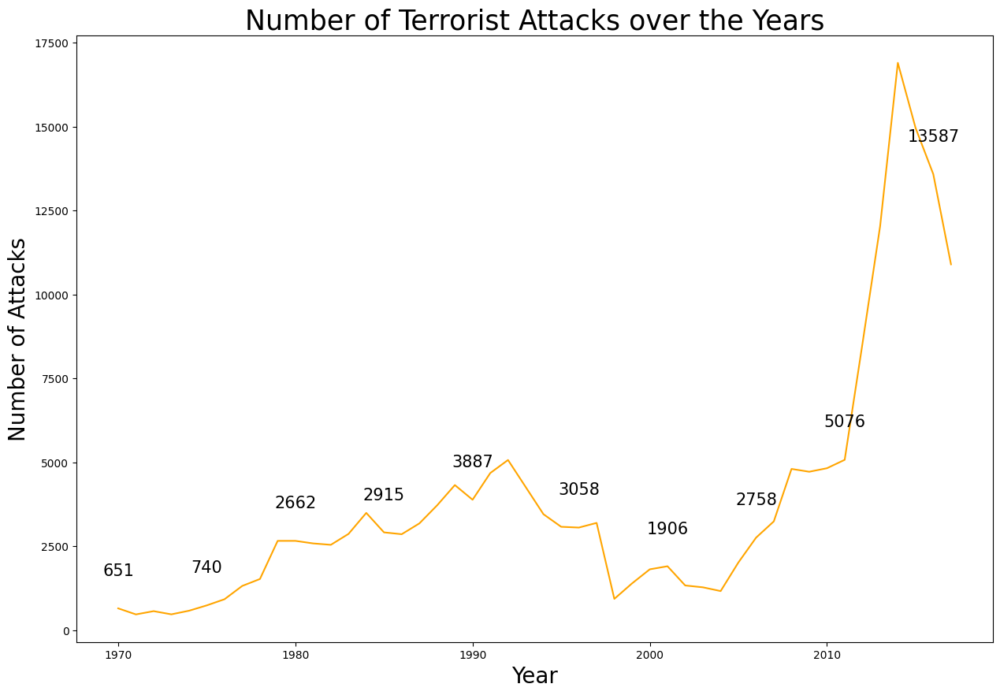

In [22]:
# Filter for necessary columns
tY_df = t_df[['iyear']]

# Count the number of attacks by year
tY1_df = tY_df.groupby(['iyear']).size().reset_index(name='counts')

# Create a line plot
plt.figure(figsize=(15,10))
plt.plot(tY1_df['iyear'], tY1_df['counts'], color='orange')
plt.title('Number of Terrorist Attacks over the Years',fontsize = 25)
plt.xlabel('Year',fontsize = 20)
plt.ylabel('Number of Attacks',fontsize = 20)

# Add annotations
for i, row in tY1_df.iterrows():
    year = row['iyear']
    count = row['counts']
    if i % 5 == 0: # Add annotation every 3 years to prevent overcrowding
        plt.annotate(count, (year, count), textcoords="offset points", xytext=(0,30), ha='center', fontsize=15)
        
plt.show()

In [23]:
# Sort the results in descending order of number of attacks
max_attacks_year = tY1_df.sort_values('counts', ascending=False).iloc[0]

# Print the year with the maximum attacks
print(f"The year with the maximum attacks is {max_attacks_year['iyear']} with {max_attacks_year['counts']} attacks.")

The year with the maximum attacks is 2014 with 16903 attacks.


## **Word cloud for Attack Type**

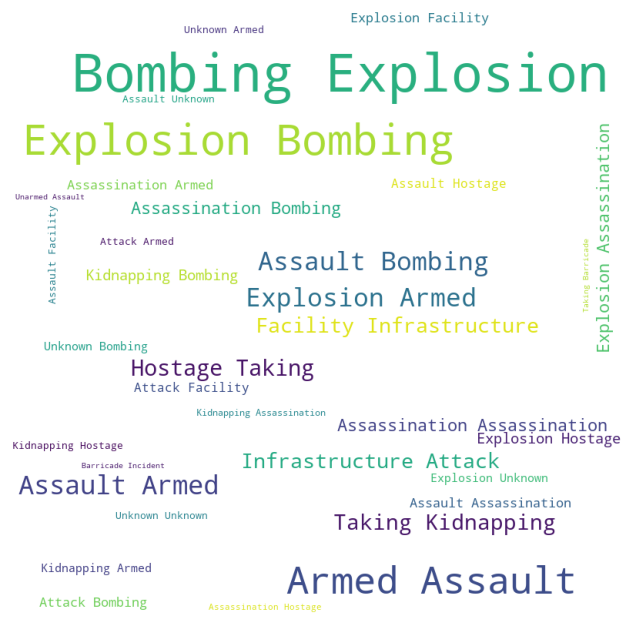

In [24]:
# Concatenate all the attack types
attack_types = ' '.join(t_df['attacktype1_txt'])

# Create a word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(attack_types)

# Plot the word cloud
plt.figure(figsize=(8,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

## **Insights obtained from EDA**

1. The Middle East and North Africa region has been the hot zone of terrorism for the past few decades, with the highest number of terrorist incidents and fatalities recorded in this region.

2. Iraq, with its capital city Baghdad, has had the most number of terrorist attacks from 1970 to 2017

3. The number of terrorist incidents has been steadily increasing over the years, with the highest number of incidents recorded in 2014.


4. Bombing/explosion is the most common type of terrorist attack, accounting for more than half of all incidents.

## **Recommendations**

1. Developing countries in the Middle East and North Africa region should focus on improving their counterterrorism measures and building strong partnerships with developed countries to combat terrorism.

2. International organizations and developed countries should provide support to developing countries in terms of training, technology, and funding to help them tackle the issue of terrorism effectively.

3. Governments should prioritize the security and safety of citizens by investing in intelligence gathering, border security, and emergency response mechanisms.

4. There should be more efforts to address the root causes of terrorism, such as poverty, political instability, and social injustice.

5. Since bombing/explosion is the most common type of terrorist attack, it is recommended to strengthen security measures around vulnerable areas such as transportation hubs, government buildings, and public spaces. Governments should invest in advanced screening technologies, surveillance systems, and other security measures to detect and prevent potential attacks. It is also important to create awareness among citizens and encourage them to report suspicious activities to authorities.